# HDIP in Data Analytics /AI

## StratThink_HDipData+AI

# Content

* [1. Scenario](#0)
* [2. Data Dictiory](#1)
* [3. Getting Started - Load Libraries and Dataset](#2)
    * [3.1. Load Libraries](#2.1)
    * [3.2. Read Dataset](#2.2)
* [4. EDA](#3)
    * [4.1. EDA Visualization](#3.1)
    * [4.2 Data Preparation](#3.2)
* [5. Modelling](#4)
    * [5.1 GridSearchCV on the best model](#4.1)
* [6. Comparison of ML modelling outcomes](#5)
    * [6.1 Comparing Regression Models - Boxplot](#5.1)
    * [6.2 Comparing Regression Models - Tables](#5.2)

<a id='0'></a>
# 1. Scenario:

Our main goal for this project is to project a Machine Learning model in order to predict the ecommerce profit. Furthermore, learn more about Ecommerce in the United States.

**Business Question:**
Which sub-category should ecommerce invest to reduce loss and maximize profit?

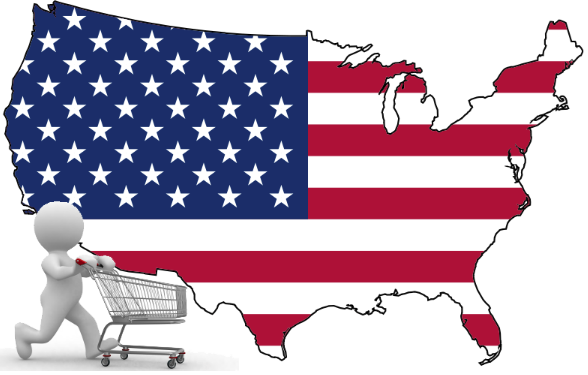

<a id='1'></a>
# 2. Data Dictionary

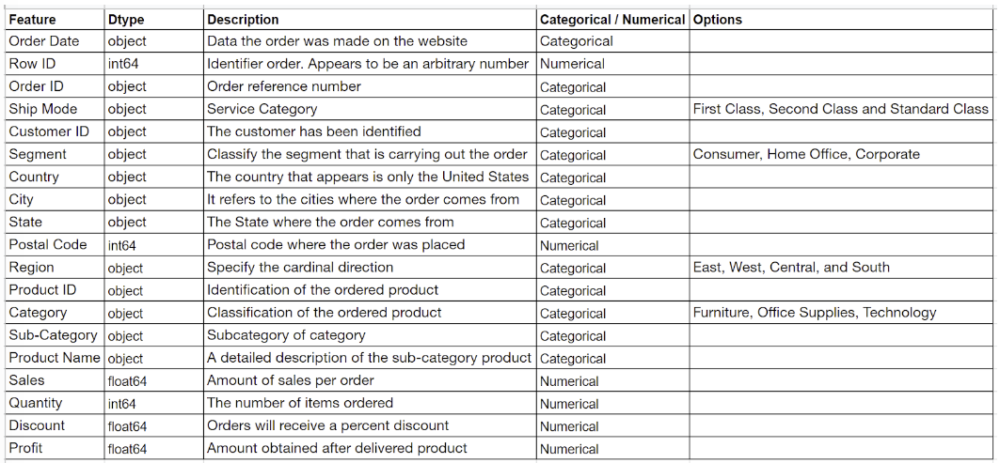

<a id='2'></a>
# 3. Getting Started - Load Libraries and Dataset

<a id='2.1'></a>
## 3.1. Load Libraries

In [1]:
#Libraries to handle dataframe and to perform statistical analysis
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

#Modelling
from sklearn.model_selection import train_test_split

#Regression Models
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import ElasticNet


# Pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from time import time

#Improve Models
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_score

#evalutation
from sklearn import metrics 
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_error
from sklearn import model_selection
from sklearn.metrics import precision_score

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff

import pandas_profiling

import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings

<a id='2.2'></a>
## 3.2. Loading the Data

In [2]:
# reading the dataset
df = pd.read_csv("US_records_2020.csv")
df.head()

,Order Date,Row ID,Order ID,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,31-10-20,6398,CA-2017-131632,Standard Class,AH-10120,Home Office,United States,Dallas,Texas,75217,Central,OFF-AR-10003651,Office Supplies,Art,Newell 350,5.248,2,0.2,4.1984
1,31-10-20,7827,CA-2017-117114,Standard Class,CY-12745,Corporate,United States,Chicago,Illinois,60610,Central,TEC-PH-10004042,Technology,Phones,ClearOne Communications CHAT 70 OC Speaker Phone,508.768,4,0.2,1424.5504
2,31-10-20,7828,CA-2017-117114,Standard Class,CY-12745,Corporate,United States,Chicago,Illinois,60610,Central,OFF-EN-10001137,Office Supplies,Envelopes,"#10 Gummed Flap White Envelopes, 100/Box",9.912,3,0.2,17.8416
3,31-08-20,1532,CA-2017-159884,Standard Class,JF-15490,Consumer,United States,Tempe,Arizona,85281,West,OFF-ST-10000344,Office Supplies,Storage,"Neat Ideas Personal Hanging Folder Files, Black",10.744,1,0.2,-2.1488
4,31-08-20,1533,CA-2017-159884,Standard Class,JF-15490,Consumer,United States,Tempe,Arizona,85281,West,OFF-FA-10000585,Office Supplies,Fasteners,OIC Bulk Pack Metal Binder Clips,8.376,3,0.2,15.0768


<a id='3'></a>
# 4. EDA

In [3]:
# checking general info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3312 entries, 0 to 3311
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Order Date    3312 non-null   object 
 1   Row ID        3312 non-null   int64  
 2   Order ID      3312 non-null   object 
 3   Ship Mode     3312 non-null   object 
 4   Customer ID   3312 non-null   object 
 5   Segment       3312 non-null   object 
 6   Country       3312 non-null   object 
 7   City          3312 non-null   object 
 8   State         3312 non-null   object 
 9   Postal Code   3312 non-null   int64  
 10  Region        3312 non-null   object 
 11  Product ID    3312 non-null   object 
 12  Category      3312 non-null   object 
 13  Sub-Category  3312 non-null   object 
 14  Product Name  3312 non-null   object 
 15  Sales         3312 non-null   float64
 16  Quantity      3312 non-null   int64  
 17  Discount      3312 non-null   float64
 18  Profit        3312 non-null 

In [4]:
# Showing some descriptive Stats
df.describe()

,Row ID,Postal Code,Sales,Quantity,Discount,Profit
count,3312.000000,3312.000000,3312.000000,3312.000000,3312.000000,3312.000000
mean,5087.107488,56186.515097,221.381418,3.766908,0.156467,830.420217
std,2817.482266,31980.375516,585.257531,2.221776,0.207429,2699.920667
min,13.000000,1841.000000,0.444000,1.000000,0.000000,-207.998400
25%,2655.750000,27978.750000,17.018000,2.000000,0.000000,21.960000
50%,5183.500000,60472.500000,53.810000,3.000000,0.200000,114.551200
75%,7498.250000,90032.000000,205.105700,5.000000,0.200000,484.004400
max,9994.000000,99301.000000,13999.960000,14.000000,0.800000,51541.172800


In [5]:
# looking for objects
df.describe(include = object)

,Order Date,Order ID,Ship Mode,Customer ID,Segment,Country,City,State,Region,Product ID,Category,Sub-Category,Product Name
count,3312,3312,3312,3312,3312,3312,3312,3312,3312,3312,3312,3312,3312
unique,322,1687,4,693,3,1,350,47,4,1525,3,17,1511
top,02-09-20,CA-2017-100111,Standard Class,JL-15835,Consumer,United States,New York City,California,West,FUR-CH-10003774,Office Supplies,Binders,Easy-staple paper
freq,36,14,1897,20,1668,3312,306,663,1095,8,2002,500,16


In [6]:
#looking for missing values in the entire dataset
df.isna().values.any()

False

### Showing outliers using boxplot

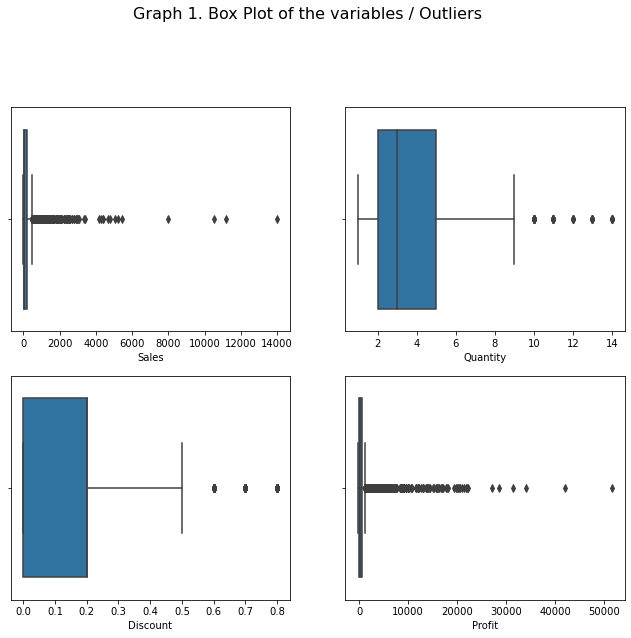

In [7]:
## Showing outliers using boxplot
plt.figure(figsize=(11,14))

plt.subplot(3,2,1)
sns.boxplot(df['Sales'])

plt.subplot(3,2,2)
sns.boxplot(df['Quantity'])

plt.subplot(3,2,3)
sns.boxplot(df['Discount'])

plt.subplot(3,2,4)
sns.boxplot(df['Profit'])

plt.suptitle("Graph 1. Box Plot of the variables / Outliers",fontsize=16)
plt.show()

<a id='3.1'></a>
## 4.1 EDA Visualizations

In [8]:
# Determinate the frequency on the "Ship_mode"  
freq = pd.Series(df['Ship Mode']).value_counts()
#Desplaying the freqency on the "Ship_mode"
Ship_df = freq.to_frame().reset_index()
Ship_df.head()

,index,Ship Mode
0,Standard Class,1897
1,Second Class,657
2,First Class,572
3,Same Day,186


In [9]:
# Ploting the categorical variable "Ship_mode"
fig = px.bar(Ship_df, x="Ship Mode", y = "index", orientation='h', color='Ship Mode',   
             color_continuous_scale=px.colors.sequential.YlGnBu,
       template="seaborn",  title="<b>Graph 2. Ship mode distribution", 
               width=950, height=650,
labels={"index" : "Ship mode",  "Ship_mode": "Frequency"})
fig.update_layout(yaxis={'categoryorder':'total ascending'}
             )
fig.update_traces(text=[df['Ship Mode'].value_counts()[0],
                        df['Ship Mode'].value_counts()[1],
                        df['Ship Mode'].value_counts()[2],
                        df['Ship Mode'].value_counts()[3]],
                        textposition='inside', textfont_size=16)            
fig.show()

In [10]:
# Determinate the frequency on the "Segment"  
freq = pd.Series(df['Segment']).value_counts()
#Desplaying the freqency on the "Segment"
Segment_df = freq.to_frame().reset_index()
Segment_df.head()

,index,Segment
0,Consumer,1668
1,Corporate,980
2,Home Office,664


In [11]:
# Ploting the categorical variable "Segment"
fig = px.bar(Segment_df, x="Segment", y = "index", orientation='h', color='Segment',
             color_continuous_scale=px.colors.sequential.YlOrRd,
       template="seaborn",  title="<b>Graph 3. Segment distribution", 
               width=950, height=650,
                  
labels={"index" : "Segment",  "Segment": "Frequency"})
fig.update_layout(yaxis={'categoryorder':'total ascending'}
                 )
fig.update_traces(text=[df['Segment'].value_counts()[0],
                        df['Segment'].value_counts()[1],
                        df['Segment'].value_counts()[2]],
                        textposition='inside', textfont_size=16)
fig.show()

In [12]:
# Determinate the frequency on the "Region"  
freq = pd.Series(df['Region']).value_counts()
#Desplaying the freqency on the "Region"
Region_df = freq.to_frame().reset_index()
Region_df.head()

,index,Region
0,West,1095
1,East,921
2,Central,778
3,South,518


In [13]:
# Ploting the categorical variable "Region"
fig = px.bar(Region_df , x="Region", y = "index", orientation='h', color='Region',   
             color_continuous_scale=px.colors.sequential.YlGnBu,
       template="seaborn",  title="<b>Graph 4. Region distribution", 
               width=950, height=650,
                  
labels={"index" : "Region",  "Region": "Frequency"})
fig.update_layout(yaxis={'categoryorder':'total ascending'}
                 )
fig.update_traces(text=[df['Region'].value_counts()[0],
                        df['Region'].value_counts()[1],
                        df['Region'].value_counts()[2],
                        df['Region'].value_counts()[3]],
                        textposition='inside',  textfont_size=16)
fig.show()

In [14]:
# Determinate the frequency on the "State"  
freq = pd.Series(df['State']).value_counts()
#Desplaying the freqency on the "State"
State_df = freq.to_frame().reset_index()
State_df.head()

,index,State
0,California,663
1,New York,352
2,Texas,317
3,Washington,215
4,Pennsylvania,197


In [15]:
#Plotting a bar chart Sales by State
fig = px.bar(State_df , x='State', y ='index', orientation='h', color= 'State', color_continuous_scale=px.colors.sequential.YlOrRd,
       template="seaborn",
 title="<b>Graph 5. State distribution",
    width=900, height=700,
labels={ "index": "State",  "State": "Frequency"})
fig.update_layout(yaxis={'categoryorder':'total ascending'},
                 ) 
fig.show()

In [16]:
# Determinate the frequency on the "Category"  
freq = pd.Series(df['Category']).value_counts()
#Desplaying the freqency on the "Category"
Category_df = freq.to_frame().reset_index()
Category_df.head()

,index,Category
0,Office Supplies,2002
1,Furniture,686
2,Technology,624


In [17]:
# Ploting the categorical variable: "Category"
fig = px.bar(Category_df , x="Category", y = "index", orientation='h', color='Category',   
             color_continuous_scale= px.colors.sequential.YlGnBu,
       template="seaborn",  title="<b>Graph 6. Category distribution", 
               width=950, height=650,
labels={"index" : "Category",  "Category": "Frequency"})
fig.update_layout(yaxis={'categoryorder':'total ascending'},
                 )
fig.update_traces(text=[df['Category'].value_counts()[0],
                        df['Category'].value_counts()[1],
                        df['Category'].value_counts()[2]
                        ],textposition='inside',  textfont_size=16)
fig.show()

In [18]:
# Determinate the frequency on the "Sub-Category"  
freq = pd.Series(df['Sub-Category']).value_counts()
#Desplaying the freqency on the "Sub-Category"
SubCategory_df = freq.to_frame().reset_index()
SubCategory_df.head()

,index,Sub-Category
0,Binders,500
1,Paper,459
2,Furnishings,316
3,Phones,294
4,Storage,288


In [19]:
# Ploting the categorical variable "Sub-Category"
fig = px.bar(SubCategory_df , x="Sub-Category", y = "index", orientation='h', color='Sub-Category',   
             color_continuous_scale=px.colors.sequential.YlOrRd,
       template="seaborn",  title="<b>Graph 7. Sub-Category distribution", 
               width=950, height=650,
                  
labels={"index" : "Sub-Category",  "Sub-Category": "Frequency"})
fig.update_layout(yaxis={'categoryorder':'total ascending'}
                 )
fig.update_traces(text=[df['Sub-Category'].value_counts()[0],
                        df['Sub-Category'].value_counts()[1],
                        df['Sub-Category'].value_counts()[2],
                        df['Sub-Category'].value_counts()[3],
                        df['Sub-Category'].value_counts()[4],
                        df['Sub-Category'].value_counts()[5],
                        df['Sub-Category'].value_counts()[6],
                        df['Sub-Category'].value_counts()[7],
                        df['Sub-Category'].value_counts()[8],
                        df['Sub-Category'].value_counts()[9],
                        df['Sub-Category'].value_counts()[10],
                        df['Sub-Category'].value_counts()[11],
                        df['Sub-Category'].value_counts()[12],
                        df['Sub-Category'].value_counts()[13],
                        df['Sub-Category'].value_counts()[14],
                        df['Sub-Category'].value_counts()[15],
                       df['Sub-Category'].value_counts()[16]],
                  textposition='inside',  textfont_size=16)
fig.show()

In [20]:
#Total Sales by State 
states_sales = df.groupby(by = ['State'])['Sales'].sum()
states_sales_index = np.array(states_sales.index)
states_sales_count = np.array(states_sales.values)

df_states = pd.DataFrame(data = states_sales_count, columns = ['Sales'])
df_states['State'] = states_sales_index
df_states = df_states.sort_values(by = ['Sales'], ascending = False)
df_states.head()

,Sales,State
3,146388.3445,California
29,93922.9950,New York
44,65539.8960,Washington
40,43421.7582,Texas
35,42688.3060,Pennsylvania


In [21]:
# Plotting Total Sales by State 
fig = px.bar(df_states, x=  'State', y= 'Sales', color= 'Sales', 
        color_continuous_scale=px.colors.sequential.YlGnBu, template="seaborn",
 title="<b>Graph 8. Total Sales by State",
    width=900, height=700,
labels={ "State": "State",  "Sales": "Sales"})
fig.update_layout(xaxis={'categoryorder':'total descending'},
                 ) 
fig.add_hline(y= df_states.Sales.mean(), line_width=3,
              line_dash="dash", line_color="black", annotation_text = "Mean",
             annotation_position="top right",
              annotation_font_size=20,
              annotation_font_color="red")
fig.show()

In [22]:
#Sales by Sub-categories
subcat_sales = df.groupby(by = ['Sub-Category'])['Sales'].sum()
subcat_sales_index = np.array(subcat_sales.index)
subcat_sales_count = np.array(subcat_sales.values)

df_subcat = pd.DataFrame(data = subcat_sales_count, columns = ['Sales'])
df_subcat['Sub-Category'] = subcat_sales_index
df_subcat = df_subcat.sort_values(by = ['Sales'], ascending = False)
df_subcat.head()

,Sales,Sub-Category
13,105340.516,Phones
5,95554.353,Chairs
3,72788.045,Binders
14,69677.618,Storage
6,62899.388,Copiers


In [23]:
# Plotting Total Sales by Sub-categories
fig = px.bar(df_subcat, x= 'Sub-Category', y= 'Sales', color= 'Sales', 
     color_continuous_scale=px.colors.sequential.YlOrRd, template="seaborn",
 title="<b>Graph 9. Total Sales by Sub-category",
    width=900, height=700,
labels={ "Sub-Category": "Sub-Category",  "Sales": "Sales"})
fig.update_layout(xaxis={'categoryorder':'total descending'},
                   )
fig.add_hline(y= df_subcat.Sales.mean(), line_width=3,
              line_dash="dash", line_color="black", annotation_text = "Mean",
             annotation_position="top right",
              annotation_font_size=20,
              annotation_font_color="red")
       
fig.show()

In [24]:
# Total Sales by Sub-categories
Cat_x_sales = df.groupby('Category')['Sales'].sum()
Cat_x_sales

Category
Furniture          215387.2692
Office Supplies    246097.1750
Technology         271730.8110
Name: Sales, dtype: float64

In [25]:
# Plotting Total Sales by Sub-categories
fig = px.bar(Cat_x_sales, x= Cat_x_sales.index, y= 'Sales', color= 'Sales', 
     color_continuous_scale=px.colors.sequential.YlGnBu, template="seaborn",
 title="<b>Graph 10. Total Sales by Category",
    width=900, height=700,
labels={ "State": "State",  "Sales": "Sales"})
fig.update_layout(yaxis={'categoryorder':'total ascending'},
                 ) 
fig.update_traces(text=['{:.2f}'.format(Cat_x_sales[0]),
                        '{:.2f}'.format(Cat_x_sales[1]),
                        '{:.2f}'.format(Cat_x_sales[2])],
                        textposition='inside',  textfont_size=16)
fig.show()

In [26]:
# Total Profit by Region
Region_x_profit = df.groupby('Region')['Profit'].sum()
Region_x_profit.sort_values(ascending = False)

Region
West       988709.619125
East       832048.436600
Central    469547.978116
South      460045.725625
Name: Profit, dtype: float64

In [27]:
# Plotting Total Profit by Region
fig = px.bar(Region_x_profit, x= Region_x_profit.index, y= 'Profit', color= 'Profit', 
     color_continuous_scale=px.colors.sequential.YlOrRd, template="seaborn",
 title="<b>Graph 11. Total Profit by Region",
    width=900, height=700,
labels={ "Region": "Region",  "Profit": "Profit"})
fig.update_layout(xaxis={'categoryorder':'total descending'},
                 ) 
fig.update_traces(text=['{:.2f}'.format(Region_x_profit.sort_values(ascending = False)[3]),
                        '{:.2f}'.format(Region_x_profit.sort_values(ascending = False)[1]),
                        '{:.2f}'.format(Region_x_profit.sort_values(ascending = False)[2]),
                        '{:.2f}'.format(Region_x_profit.sort_values(ascending = False)[0])],
                        textposition='inside',  textfont_size=16)
fig.show()

In [28]:
#Total Profit by Sub-categories
subcat_profit = df.groupby(by = ['Sub-Category'])['Profit'].sum()
subcat_profit_index = np.array(subcat_profit.index)
subcat_profit_count = np.array(subcat_profit.values)

df_subcatpr = pd.DataFrame(data = subcat_profit_count, columns = ['Profit'])
df_subcatpr['Sub-Category'] = subcat_profit_index
df_subcatpr = df_subcatpr.sort_values(by = ['Profit'],ascending = False)
df_subcatpr.head()

,Profit,Sub-Category
13,417364.3288,Phones
5,359990.3137,Chairs
3,266454.1349,Binders
0,259336.0576,Accessories
14,253791.1224,Storage


In [29]:
# Plotting Total Profit by Sub-categories
fig = px.bar(df_subcatpr, x= 'Sub-Category', y= 'Profit', color= 'Profit', 
     color_continuous_scale=px.colors.sequential.YlGnBu, template="seaborn",
 title="<b>Graph 12. Total Profit by Sub-category",
    width=900, height=700,
labels={ "Sub-Category": "Sub-Category",  "Profit": "Profit"})
fig.update_layout(xaxis={'categoryorder':'total descending'},
                 ) 
fig.add_hline(y= df_subcatpr.Profit.mean(), line_width=1,
              line_dash="dash", line_color="black", 
              annotation_text="Mean", 
              annotation_position="top right",
              annotation_font_size=20,
              annotation_font_color="red")
fig.show()

In [30]:
#Total Profit by Category
cat_x_profit = df.groupby('Category')['Profit'].sum()
cat_x_profit

Category
Furniture          821740.368066
Office Supplies    956959.832900
Technology         971651.558500
Name: Profit, dtype: float64

In [31]:
# Plotting Total Profit by Category
fig = px.bar(cat_x_profit, x= cat_x_profit.index, y= 'Profit', color= 'Profit', 
     color_continuous_scale=px.colors.sequential.YlOrRd, template="seaborn",
 title="<b>Graph 13. Total Profit by Category",
    width=900, height=700,
labels={ "Sub-Category": "Category",  "Profit": "Profit"})
fig.update_layout(xaxis={'categoryorder':'total descending'},
                 ) 
fig.update_traces(text=['{:.2f}'.format(cat_x_profit[0]),
                        '{:.2f}'.format(cat_x_profit[1]),
                        '{:.2f}'.format(cat_x_profit[2])],
                        textposition='inside',  textfont_size=16)
fig.show()

In [32]:
df.head(3)

,Order Date,Row ID,Order ID,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,31-10-20,6398,CA-2017-131632,Standard Class,AH-10120,Home Office,United States,Dallas,Texas,75217,Central,OFF-AR-10003651,Office Supplies,Art,Newell 350,5.248,2,0.2,4.1984
1,31-10-20,7827,CA-2017-117114,Standard Class,CY-12745,Corporate,United States,Chicago,Illinois,60610,Central,TEC-PH-10004042,Technology,Phones,ClearOne Communications CHAT 70 OC Speaker Phone,508.768,4,0.2,1424.5504
2,31-10-20,7828,CA-2017-117114,Standard Class,CY-12745,Corporate,United States,Chicago,Illinois,60610,Central,OFF-EN-10001137,Office Supplies,Envelopes,"#10 Gummed Flap White Envelopes, 100/Box",9.912,3,0.2,17.8416


### Checking variables' relation

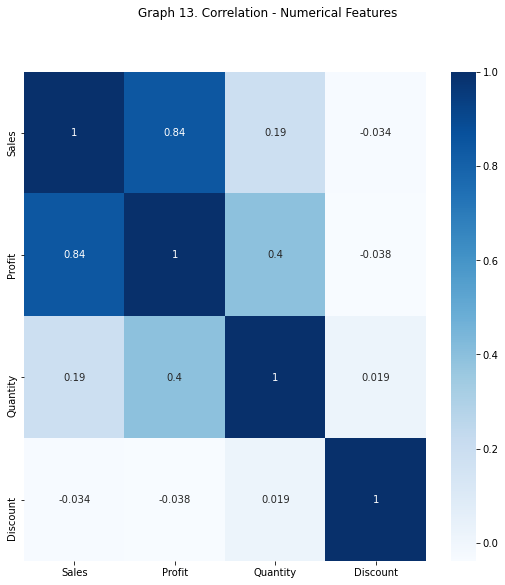

In [33]:
# Checking variables' relation

f, ax = plt.subplots(1, 1, figsize=(9, 9))
ax = sns.heatmap(df[['Sales', 'Profit', 'Quantity', 'Discount' ]].corr(), annot=True, cmap='Blues').figure.suptitle("Graph 13. Correlation - Numerical Features")

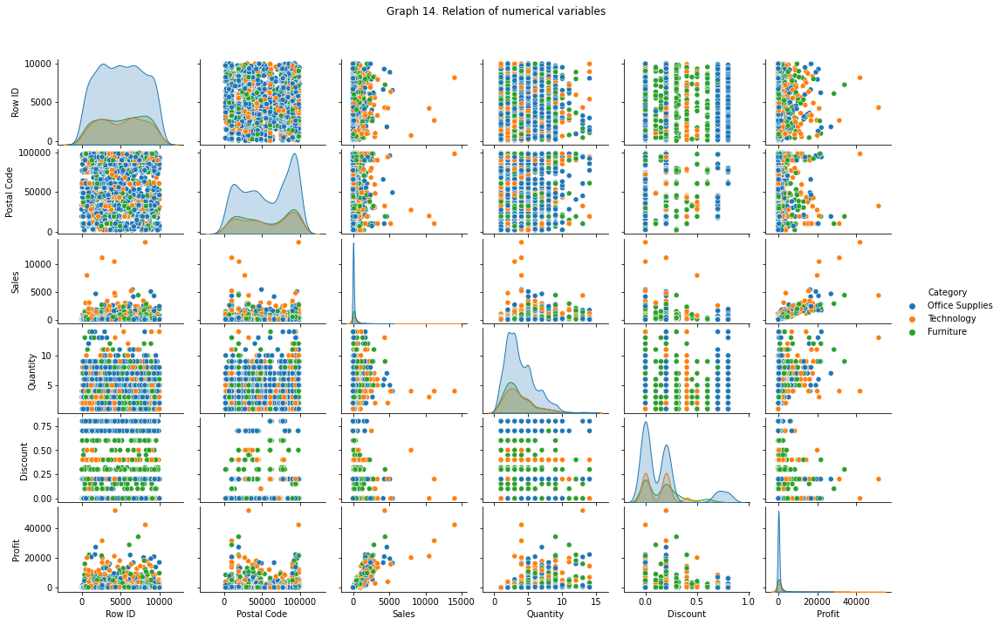

In [34]:
# Checking variables' relation

g=sns.pairplot(df, hue="Category")

g.fig.suptitle("Graph 14. Relation of numerical variables", y=1.08) # y= some height>1
g.fig.set_size_inches(16,9)

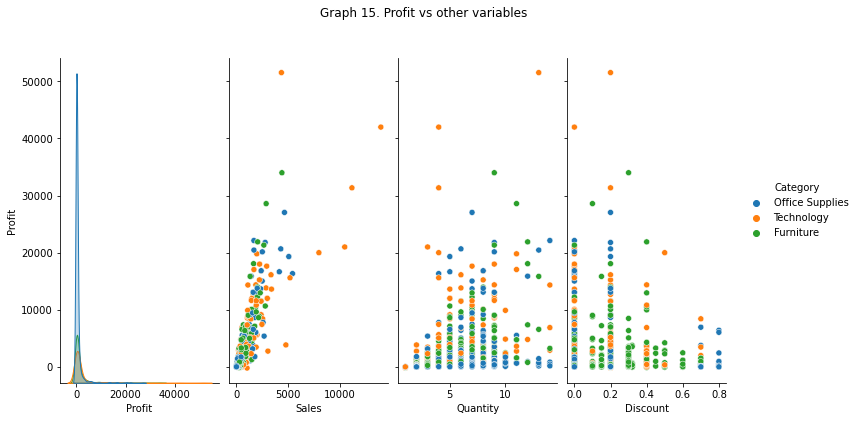

In [35]:
# Checking variables' relation

f =sns.pairplot(df, 
             x_vars=["Profit", "Sales", "Quantity", "Discount"],
             y_vars=["Profit"],
             hue="Category")
f.fig.suptitle("Graph 15. Profit vs other variables", y=1.08) # y= some height>1
f.fig.set_size_inches(12,6)

### Pandas Profiling

The code may be commentated in order to make the Jupyter Notebook appears correctly on GitHub. However, different and important information was obtained with this library.

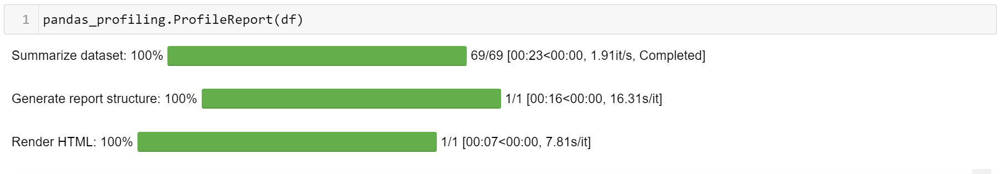

In [36]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<a id='3.2'></a>
## 4.2 Data Preparation

In [37]:
# copying df
df_prep = df.copy()
df_prep.head(3)

,Order Date,Row ID,Order ID,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,31-10-20,6398,CA-2017-131632,Standard Class,AH-10120,Home Office,United States,Dallas,Texas,75217,Central,OFF-AR-10003651,Office Supplies,Art,Newell 350,5.248,2,0.2,4.1984
1,31-10-20,7827,CA-2017-117114,Standard Class,CY-12745,Corporate,United States,Chicago,Illinois,60610,Central,TEC-PH-10004042,Technology,Phones,ClearOne Communications CHAT 70 OC Speaker Phone,508.768,4,0.2,1424.5504
2,31-10-20,7828,CA-2017-117114,Standard Class,CY-12745,Corporate,United States,Chicago,Illinois,60610,Central,OFF-EN-10001137,Office Supplies,Envelopes,"#10 Gummed Flap White Envelopes, 100/Box",9.912,3,0.2,17.8416


### Missing values

In [38]:
# checking the missing values 
df_prep.isnull().sum()

Order Date      0
Row ID          0
Order ID        0
Ship Mode       0
Customer ID     0
Segment         0
Country         0
City            0
State           0
Postal Code     0
Region          0
Product ID      0
Category        0
Sub-Category    0
Product Name    0
Sales           0
Quantity        0
Discount        0
Profit          0
dtype: int64

### Dropping unnecessary columns

In [39]:
# Dropping unnecessary columns
df_prep.drop(['Order Date',
              "Row ID",
              "Order ID", 
              "Customer ID", 
              "Country",
              "Sub-Category",
              "City",
              "State",
              "Postal Code", 
              "Product ID", 
              "Product Name", 
              "City"], axis=1, inplace=True)
df_prep.head(3)

,Ship Mode,Segment,Region,Category,Sales,Quantity,Discount,Profit
0,Standard Class,Home Office,Central,Office Supplies,5.248,2,0.2,4.1984
1,Standard Class,Corporate,Central,Technology,508.768,4,0.2,1424.5504
2,Standard Class,Corporate,Central,Office Supplies,9.912,3,0.2,17.8416


### Renaming columns

In [40]:
# renaming features
df_prep.rename(columns = {'Ship Mode':'ship_mode'}, inplace = True)
df_prep.head(3)

,ship_mode,Segment,Region,Category,Sales,Quantity,Discount,Profit
0,Standard Class,Home Office,Central,Office Supplies,5.248,2,0.2,4.1984
1,Standard Class,Corporate,Central,Technology,508.768,4,0.2,1424.5504
2,Standard Class,Corporate,Central,Office Supplies,9.912,3,0.2,17.8416


### Duplicates

In [41]:
# looking for duplicated rows
dup_df = df_prep[df.duplicated()]

# Showing the number of duplicated rows
print("Number of duplicated rows before dropping: ", dup_df.shape)

df_prep.drop_duplicates(inplace=True)

# looking for duplicated rows
dup_df = df_prep[df.duplicated()]

# Showing the number of duplicated rows
print("Number of duplicated rows after dropping: ", dup_df.shape)

Number of duplicated rows before dropping:  (0, 8)
Number of duplicated rows after dropping:  (0, 8)


### Preparing for regression

In [42]:
# copying df
prep_reg = df_prep.copy()
prep_reg.head(3)

,ship_mode,Segment,Region,Category,Sales,Quantity,Discount,Profit
0,Standard Class,Home Office,Central,Office Supplies,5.248,2,0.2,4.1984
1,Standard Class,Corporate,Central,Technology,508.768,4,0.2,1424.5504
2,Standard Class,Corporate,Central,Office Supplies,9.912,3,0.2,17.8416


### Encoding

In [43]:
# encoding the categorical features
prep_reg = pd.get_dummies(prep_reg, columns=['ship_mode', 
                                             'Segment', 
                                             'Region', 
                                             'Category'])


prep_reg.head(3)

,Sales,Quantity,Discount,Profit,ship_mode_First Class,ship_mode_Same Day,ship_mode_Second Class,ship_mode_Standard Class,Segment_Consumer,Segment_Corporate,Segment_Home Office,Region_Central,Region_East,Region_South,Region_West,Category_Furniture,Category_Office Supplies,Category_Technology
0,5.248,2,0.2,4.1984,0,0,0,1,0,0,1,1,0,0,0,0,1,0
1,508.768,4,0.2,1424.5504,0,0,0,1,0,1,0,1,0,0,0,0,0,1
2,9.912,3,0.2,17.8416,0,0,0,1,0,1,0,1,0,0,0,0,1,0


### Feature Importance

In [44]:
# Splitting the dataset
X_imp = prep_reg.drop(columns = 'Profit')
y_imp = prep_reg['Profit']

In [45]:
# importing the classifier

classifier_importance = RandomForestRegressor()
classifier_importance.fit(X_imp, y_imp)

RandomForestRegressor()

In [46]:
# selecting the features
importances = classifier_importance.feature_importances_
columns = X_imp.columns
columns

Index(['Sales', 'Quantity', 'Discount', 'ship_mode_First Class',
       'ship_mode_Same Day', 'ship_mode_Second Class',
       'ship_mode_Standard Class', 'Segment_Consumer', 'Segment_Corporate',
       'Segment_Home Office', 'Region_Central', 'Region_East', 'Region_South',
       'Region_West', 'Category_Furniture', 'Category_Office Supplies',
       'Category_Technology'],
      dtype='object')

In [47]:
# showing the feature importance
featureImportance = pd.DataFrame(data=importances, columns=['Importance'], index=columns)
featureImportance.sort_values(by='Importance', inplace=True, ascending=False)
featureImportance

,Importance
Sales,0.824855
Quantity,0.145368
Segment_Corporate,0.004392
Region_East,0.003838
Segment_Consumer,0.003751
ship_mode_Standard Class,0.003563
Discount,0.002629
Category_Office Supplies,0.002471
ship_mode_First Class,0.002026
Region_South,0.001856


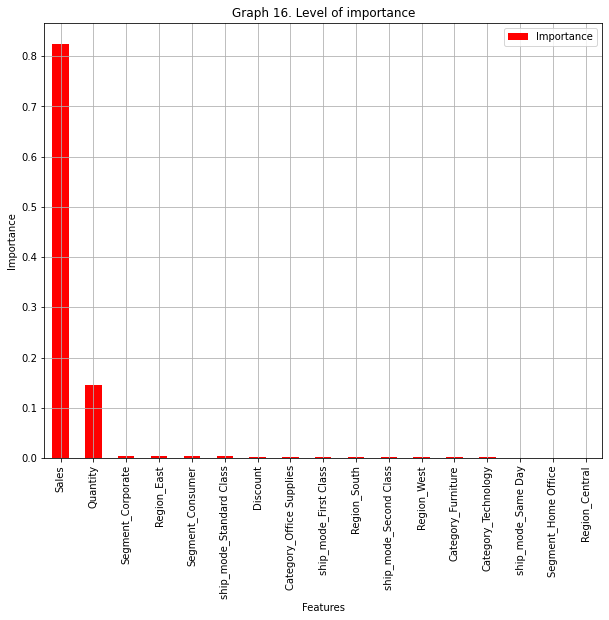

In [48]:
# Plotting the feature importance
featureImportance.plot(kind='bar', 
                       colormap='autumn', 
                       figsize=(10, 8),
                       xlabel='Features',
                       ylabel='Importance',
                       title='Graph 16. Level of importance',
                       grid= True
                      );

### Splititng the dataset

In [49]:
# Spliting the dataset - 0.20
X = prep_reg.drop('Profit', axis=1)
y = prep_reg['Profit']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

<a id='4'></a>
# 5. Modelling

In [50]:
# creating the regressors
regressors = [
    LinearRegression(),
    Lasso(),
    Ridge(),
    ElasticNet(),
    KNeighborsRegressor(),
    RandomForestRegressor(random_state=5),
]

In [51]:
#running all the models
head = 6
for model in regressors[:head]:
    start = time()
    model.fit(X_train, y_train)
    train_time = time() - start
    start = time()
    y_pred = model.predict(X_test)
    predict_time = time()-start    
    print(model)
    print("\tTraining time: %0.3fs" % train_time)
    print("\tPrediction time: %0.3fs" % predict_time)
    print("\tScore (Train):", model.score(X_train, y_train))
    print()

LinearRegression()
	Training time: 0.003s
	Prediction time: 0.002s
	Score (Train): 0.7491804310888348

Lasso()
	Training time: 0.003s
	Prediction time: 0.000s
	Score (Train): 0.7491715559827588

Ridge()
	Training time: 0.001s
	Prediction time: 0.001s
	Score (Train): 0.7491804164067826

ElasticNet()
	Training time: 0.001s
	Prediction time: 0.001s
	Score (Train): 0.7480243825997843

KNeighborsRegressor()
	Training time: 0.001s
	Prediction time: 0.026s
	Score (Train): 0.8197365928445669

RandomForestRegressor(random_state=5)
	Training time: 0.487s
	Prediction time: 0.013s
	Score (Train): 0.9839553716867552



<a id='4.1'></a>
## 5.1 Grid Search on the best models

### Random Forest Regressor

In [52]:
# creating a regressor
regressor_RFR = RandomForestRegressor()

# doing the gridSearch
RFR_params = [{'max_depth': [10, 15, 20, 25], 
               'max_features': [11, 13, 15, 17], 
               'n_estimators': [20, 30, 40],
               'min_samples_split': [2, 3, 4],
               'bootstrap': [True, False],
               'random_state':[0, 5]
              
              }]

grid_reg_RFR = GridSearchCV(regressor_RFR, RFR_params, cv = 5)

# fitting the model
grid_reg_RFR.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid=[{'bootstrap': [True, False],
                          'max_depth': [10, 15, 20, 25],
                          'max_features': [11, 13, 15, 17],
                          'min_samples_split': [2, 3, 4],
                          'n_estimators': [20, 30, 40],
                          'random_state': [0, 5]}])

In [53]:
# Showing the best parameters
grid_reg_RFR.best_params_

{'bootstrap': True,
 'max_depth': 15,
 'max_features': 15,
 'min_samples_split': 2,
 'n_estimators': 30,
 'random_state': 0}

In [54]:
# Showing the best score
print(grid_reg_RFR.best_score_)

0.9338916952534682


### KNeighbors Regressor

In [55]:
regressor_KNN = KNeighborsRegressor()

# doing the gridSearch
KNN_params = [{'n_neighbors': [3, 5, 9, 11, 13, 15, 17, 19, 21],
              
              }]

grid_reg_KNN = GridSearchCV(regressor_KNN, KNN_params, cv = 10)

# fitting the model
grid_reg_KNN.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=KNeighborsRegressor(),
             param_grid=[{'n_neighbors': [3, 5, 9, 11, 13, 15, 17, 19, 21]}])

In [56]:
# Showing the best parameters
grid_reg_KNN.best_params_

{'n_neighbors': 11}

In [57]:
# Showing the best score
print(grid_reg_KNN.best_score_)

0.7331854115479739


<a id='5'></a>
# 6. Comparison of ML modelling outcomes

<a id='5.1'></a>
## 6.1 Comparing Regression Models - Boxplot

### Train Set

Linear Regression: 0.720547 (0.118098)
Random Forest Regression: 0.895364 (0.158191)
Lasso Regression: 0.720834 (0.118039)
Ridge Regression: 0.720560 (0.118093)
KNeighbors Regressor: 0.691364 (0.137386)
Elastic Net: 0.724461 (0.117758)
KNeighbors Regressor - GridSearch: 0.733185 (0.086968)
Random Forest Regression - GridSearch: 0.905803 (0.104005)


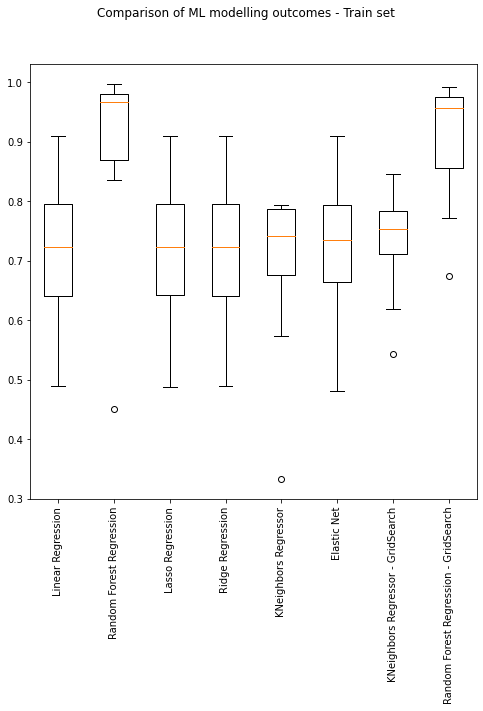

In [58]:
# comparing the models performance using a boxplot

# preparing the models
models = []

models.append(('Linear Regression', LinearRegression()))
models.append(('Random Forest Regression', RandomForestRegressor(random_state=5)))
models.append(('Lasso Regression', Lasso(alpha=1.0)))
models.append(('Ridge Regression', Ridge()))
models.append(('KNeighbors Regressor', KNeighborsRegressor()))
models.append(('Elastic Net', ElasticNet()))
models.append(('KNeighbors Regressor - GridSearch', KNeighborsRegressor(n_neighbors = 11)))
models.append(('Random Forest Regression - GridSearch', RandomForestRegressor(max_depth=15, 
                                                                              max_features= 15, 
                                                                              n_estimators= 30,               
                                                                              min_samples_split= 2,
                                                                              bootstrap= True,
                                                                              random_state=0)))

# evaluating each model in turn
results = []
names = []
scoring = 'r2'
for name, model in models:
    kfold = model_selection.KFold(n_splits=10)
    cv_results = model_selection.cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
    
    
# boxplot algorithm comparison
fig = plt.figure(figsize =(8, 8))
fig.suptitle('Comparison of ML modelling outcomes - Train set')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=90)
plt.show()

### Test Set

Linear Regression: 0.824515 (0.095319)
Random Forest Regression: 0.943183 (0.052319)
Lasso Regression: 0.824963 (0.094990)
Ridge Regression: 0.824661 (0.095239)
KNeighbors Regressor: 0.692300 (0.284586)
Elastic Net: 0.829889 (0.095775)
KNeighbors Regressor - GridSearch: 0.790712 (0.140988)
Random Forest Regression - GridSearch: 0.935421 (0.064860)


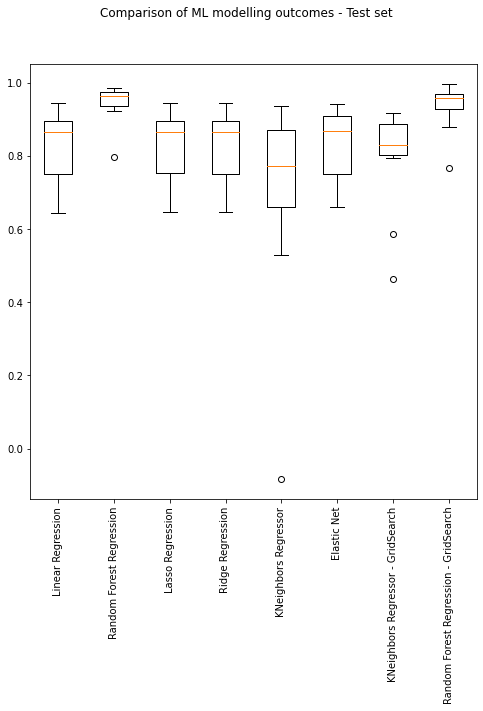

In [59]:
# comparing the models performance using a boxplot

# preparing the models
models = []

models.append(('Linear Regression', LinearRegression()))
models.append(('Random Forest Regression', RandomForestRegressor(random_state=5)))
models.append(('Lasso Regression', Lasso(alpha=1.0)))
models.append(('Ridge Regression', Ridge()))
models.append(('KNeighbors Regressor', KNeighborsRegressor()))
models.append(('Elastic Net', ElasticNet()))
models.append(('KNeighbors Regressor - GridSearch', KNeighborsRegressor(n_neighbors = 11)))
models.append(('Random Forest Regression - GridSearch', RandomForestRegressor(max_depth=15, 
                                                                              max_features= 15, 
                                                                              n_estimators= 30,               
                                                                              min_samples_split= 2,
                                                                              bootstrap= True,
                                                                              random_state=0)))

# evaluating each model in turn
results = []
names = []
scoring = 'r2'
for name, model in models:
    kfold = model_selection.KFold(n_splits=10)
    cv_results = model_selection.cross_val_score(model, X_test, y_test, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
    
    
# boxplot algorithm comparison
fig = plt.figure(figsize =(8, 8))
fig.suptitle('Comparison of ML modelling outcomes - Test set')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=90)
plt.show()

<a id='5.2'></a>
## 6.2 Comparing Regression Models - Tables

In [60]:
# creating a table to compare the models

models_columns = []
models_comparison  = pd.DataFrame(columns = models_columns)

row_index = 0
for name, model in models:  
    
    predicted = model.fit(X_train, y_train).predict(X_test)

    model_name = name
    models_comparison.loc[row_index,'Model used'] = model_name
    models_comparison.loc[row_index, 'Score - Train Set'] = round(model.score(X_train, y_train), 4)
    models_comparison.loc[row_index, 'R2 Metrics - Test Set'] = round(r2_score(y_test,predicted), 4)

    row_index+=1
    
# Saving the models performance in a table
models_comparison.sort_values(by = ['R2 Metrics - Test Set'], ascending = False, inplace = True)    
heat_reg = models_comparison.set_index('Model used')

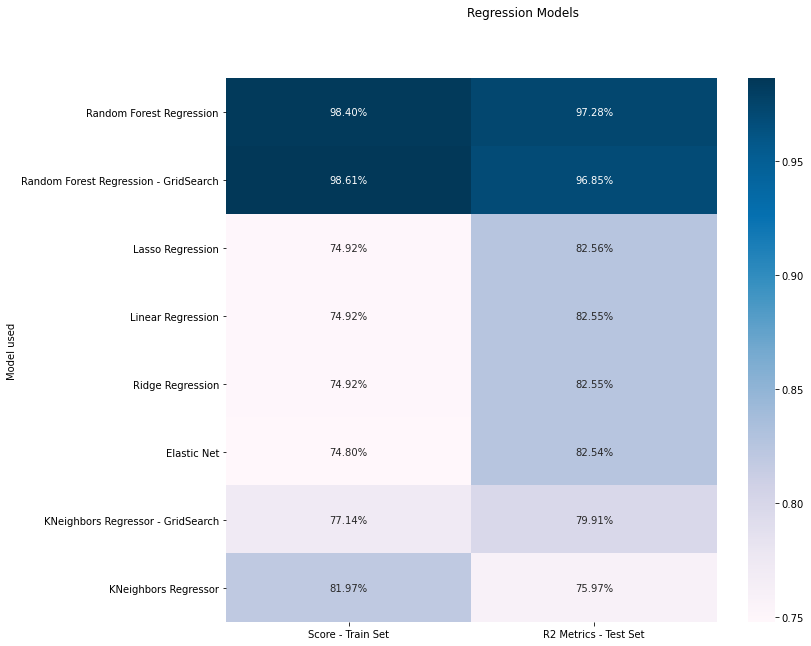

In [61]:
# plotting a heatmap with the regression models performance
plt.figure(figsize=(11, 10))

sns.heatmap(heat_reg, cmap='PuBu', annot=True, fmt='.2%').figure.suptitle("Regression Models")

plt.show()